In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

## NEED TO SET UP meas_modelfit *before starting ipython* for code at bottom (not included in lsst_apps!)

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10), 
                         #varFlux2=np.repeat(620*np.sqrt(2), 20),
                         n_sources=600, verbose=True, sourceFluxRange=(2000., 120000.), 
                         variablesAvoidBorder=3.5, psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 9 368.142255845 52.2977464926 0 5000
Variable source: 3 437.677528631 394.051374239 0 5000
Variable source: 7 77.2355874401 392.237254371 0 5000
Variable source: 10 66.5809759253 363.20308398 0 5000
Variable source: 6 352.24315562 433.633351478 0 5000
Variable source: 1 237.897633976 429.430670374 0 5000
Variable source: 11 89.7121431268 243.982084998 0 5000
Variable source: 2 260.515557753 389.705213876 0 5000
Variable source: 8 184.879430277 305.582257912 0 5000
Variable source: 0 300.731568916 220.088731954 0 5000
{'Zogy': {'FP': 35, 'FN': 0, 'TP': 10}, 'ALstack': {'FP': 4, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 27, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}


In [3]:
import lsst.afw.geom as afwGeom

exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

exposure.setPsf(testObj.variablePsf.getCoaddPsf(exposure))
exposure.getPsf().computeKernelImage(afwGeom.Point2D(28., 66.)).getDimensions()

Extent2I(27, 25)

A&L(dec): stats(mean=0.048669923, stdev=24.777611, min=-222.48573, max=343.27081)
Zogy: stats(mean=-0.04197168, stdev=24.977856, min=-926.54474, max=898.99878)
A&L(dec) - Zogy: stats(mean=-0.041019246, stdev=2.704788, min=-850.97797, max=900.02704)
A&L(dec) - A&L: stats(mean=-0.032259393, stdev=6.9194531, min=-58.314606, max=57.100204)
Scorr: stats(mean=2.5644283e-06, stdev=0.00026812186, min=-0.0175256, max=0.014269766)
Scorr_var: stats(mean=0.00025204156, stdev=1.4944854e-06, min=0.00024662129, max=0.0010555496)


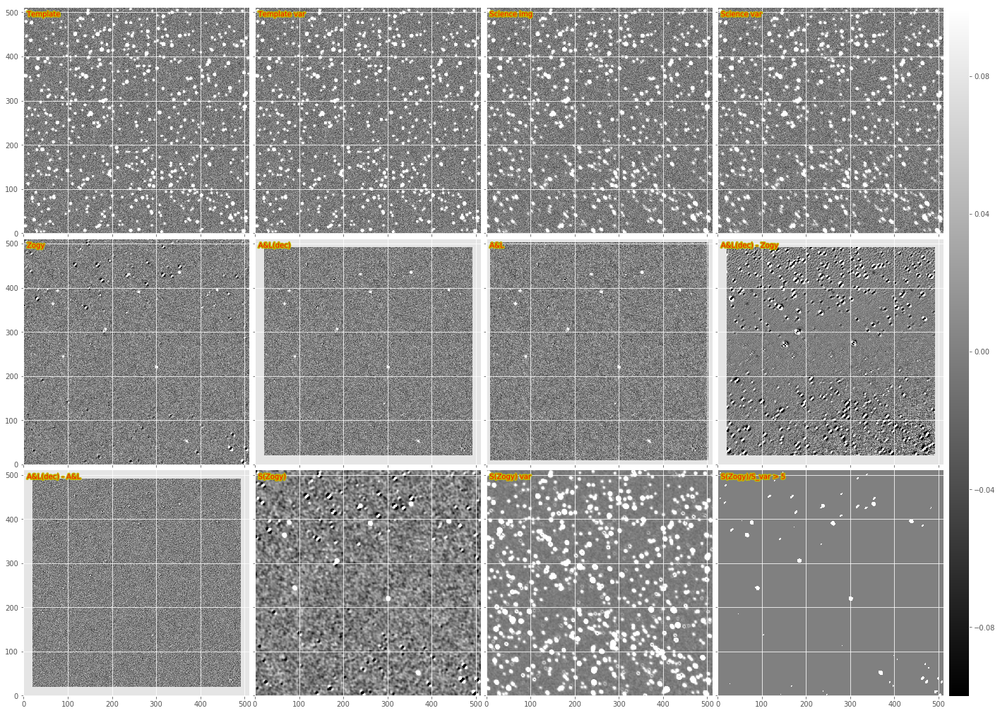

In [4]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.afw.math as afwMath
import lsst.meas.algorithms as measAlg
import lsst.pipe.base as pipeBase
import lsst.ip.diffim as ipDiffim

In [6]:
config = dit.DecorrelateALKernelMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [7]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()

In [8]:
exposure2 = testObj.im2.asAfwExposure()
obj = dit.tasks.PsfMeasurement(exposure2)
obj.run()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
obj = dit.tasks.PsfMeasurement(template2)
obj.run()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

538
540


In [9]:
ALres = dit.tasks.doAlInStack(template2, exposure2, doWarping=False, doDecorr=True, doPreConv=False,
            spatialBackgroundOrder=0, spatialKernelOrder=2)

In [10]:
newExpC = task.run(ALres.subtractedExposure, template=template2, science=exposure2,
                  alTaskResult=ALres, forceEvenSized=True).exposure

Grid parameters: 46 46 41.8671875 41.8671875 14 14


diffimTests/imageMapReduce.py:282: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:283: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [11]:
testObj2 = testObj.clone()
testObj2.ALres.decorrelatedDiffim = newExpC
testObj2.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 35, 'TP': 10}}

Finally, let's compare it to spatially-varying ZOGY!

NOTE that the `gridStep/gridSize` combo doesn't seem to correctly fully cover the entire image in all cases! In this case (the default), it does, but if I uncomment the 'gridStep' setting line below, it doesn't.

In [12]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [13]:
newExpZ = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExpZ_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

Grid parameters: 46 46 37.31640625 37.31640625 14 14


In [14]:
testObj3 = testObj.clone()
testObj3.ALres.decorrelatedDiffim = newExpC
testObj3.D_Zogy = newExpZ
testObj3.S_Zogy = newExpZ_Scorr
testObj3.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 1, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 1, 'TP': 10}}

A&L(dec): stats(mean=0.051389098, stdev=24.659925, min=-219.71222, max=333.62772)
Zogy: stats(mean=0.038896445, stdev=24.774048, min=-664.19006, max=400.3591)
A&L(dec) - Zogy: stats(mean=-0.017226698, stdev=27.402258, min=-255.60265, max=210.60814)
A&L(dec) - A&L: stats(mean=-0.034124952, stdev=6.8241849, min=-56.203217, max=48.563858)
Scorr: stats(mean=3.2182511e-06, stdev=0.00025002242, min=-0.0041951239, max=0.014513666)
Scorr_var: stats(mean=0.00024767284, stdev=1.5324065e-05, min=0.0002161278, max=0.00089541508)


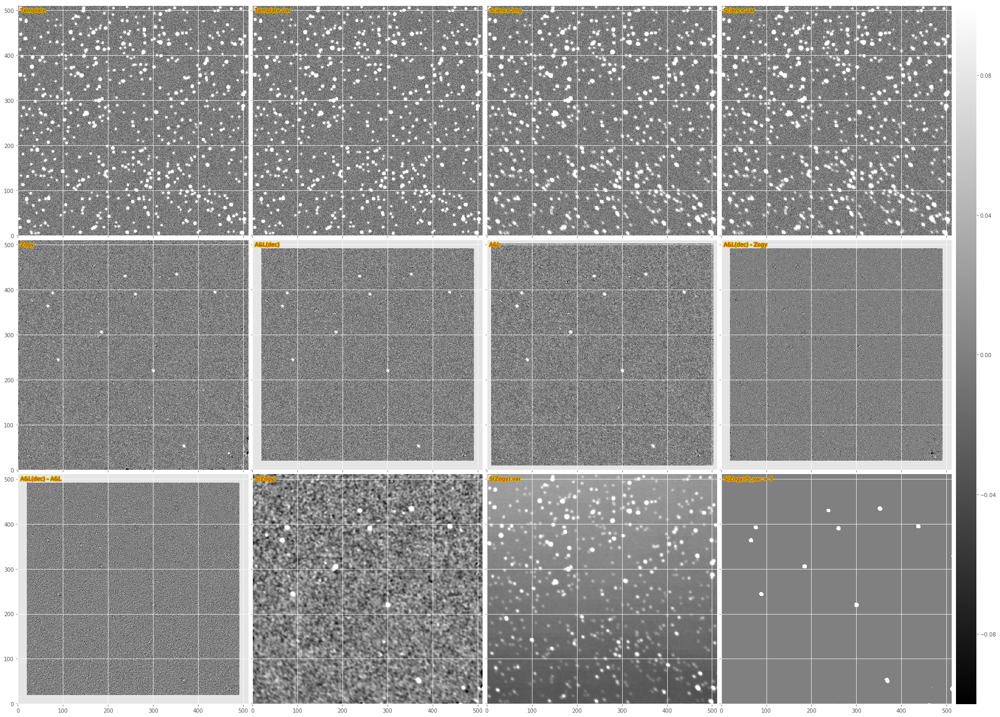

In [15]:
testObj3.doPlot(imScale=8, include_Szogy=True); #, centroidCoord=[424,66]);

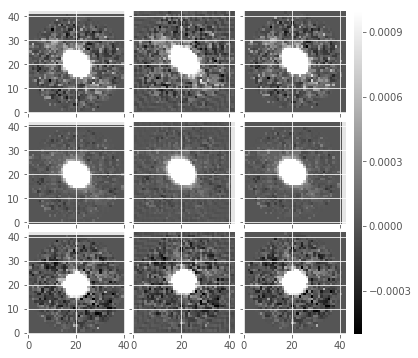

In [16]:
def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
    
dit.plotImageGrid((gp(exposure2, [80,80]), gp(newExpC, [80,80]), gp(newExpZ, [80,80]),
                   gp(exposure2, [255,255]), gp(newExpC, [255,255]), gp(newExpZ, [255,255]),
                   gp(exposure2, [480,480]), gp(newExpC, [480,480]), gp(newExpZ, [480,480]),), 
                  clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

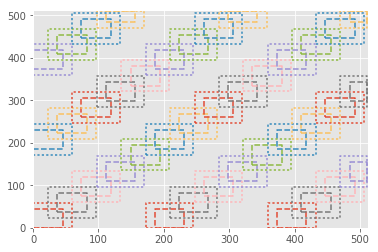

In [17]:
task.plotBoxes(exposure2.getBBox(), skip=5)

`inImageSpace = True`

Need to increase the border size

Definitely takes a while!

{'gridStepY': 3.0, 'gridStepX': 3.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 6.0, 'borderSizeY': 6.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}
Grid parameters: 46 46 12.7421875 12.7421875 28 28


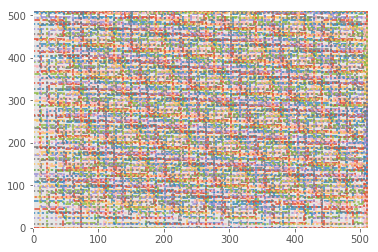

In [46]:
config = dit.ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 3
#config.gridSizeX = config.gridSizeY = 15
config.borderSizeX = config.borderSizeY = 6
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

task._generateGrid(exposure2, forceEvenSized=True)
task.plotBoxes(exposure2.getBBox(), skip=5)

In [19]:
newExpZIS = task.run(exposure2, template=template2, inImageSpace=True,
                       Scorr=False, forceEvenSized=True).exposure
#newExpZIS_Scorr = task.run(exposure2, template=template2, inImageSpace=True,
#                       Scorr=True, forceEvenSized=True).exposure

In [20]:
testObj3IS = testObj.clone()
testObj3IS.ALres.decorrelatedDiffim = newExpC
testObj3IS.D_Zogy = newExpZIS  #dit.Exposure(ga(newExpZ), testObj.D_Zogy.psf, gv(newExpZ))
#testObj3IS.S_Zogy = newExpZIS_Scorr  #dit.Exposure(ga(newExpZ_Scorr), dit.psf.afwPsfToArray(newExpZ_Scorr.getPsf()), gv(newExpZ_Scorr))
testObj3IS.runTest(spatialKernelOrder=2)

{'ALstack': {'FN': 0, 'FP': 4, 'TP': 10},
 'ALstack_decorr': {'FN': 0, 'FP': 0, 'TP': 10},
 'SZogy': {'FN': 0, 'FP': 27, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 3, 'TP': 10}}

stats(mean=0.18508714, stdev=2.5660434, min=-672.19006, max=386.28979)


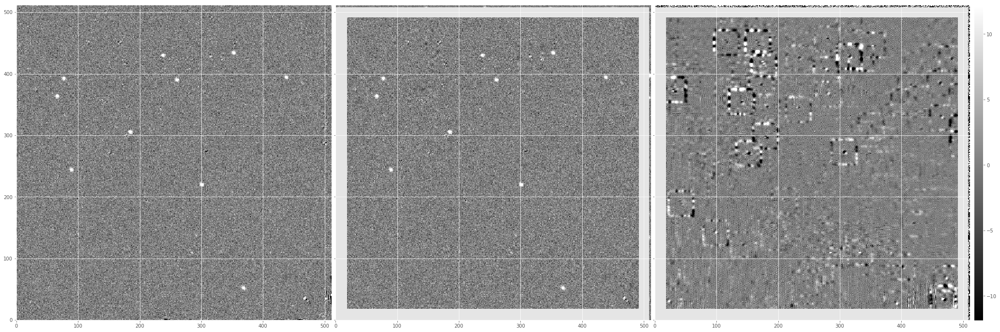

In [21]:
print dit.computeClippedImageStats(ga(newExpZ)-ga(newExpZIS))
dit.plotImageGrid((ga(newExpZ), ga(newExpZIS), ga(newExpZ)-ga(newExpZIS)), imScale=12)

In [22]:
#newExp_Scorr = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf,
#                       Scorr=True, forceEvenSized=True).exposure
newExp_Ispace = task.run(exposure, template=template, inImageSpace=True, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure, template=template, inImageSpace=False, 
                         variablePsf=testObj.variablePsf,
                         Scorr=False, forceEvenSized=True).exposure

stats(mean=0.075261317, stdev=24.652197, min=-215.38904, max=338.81369)
stats(mean=0.018441375, stdev=24.679312, min=-551.59259, max=338.81424)
stats(mean=-0.00011198925, stdev=0.0042004087, min=-0.80084181, max=0.5688622)


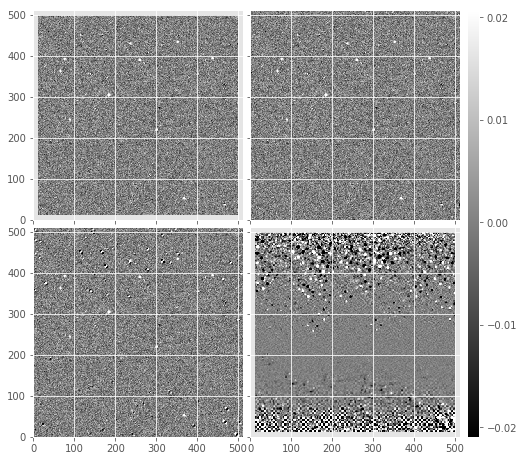

In [23]:
#Sim = ga(newExp_Scorr)
#Svar = newExp_Scorr.getMaskedImage().getVariance().getArray()
#print dit.computeClippedImageStats(Sim-testObj.S_Zogy.im)
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

In [24]:
newExp_Ispace = task.run(exposure2, template=template2, inImageSpace=True, 
                       Scorr=False, forceEvenSized=True).exposure
newExp_Fspace = task.run(exposure2, template=template2, inImageSpace=False, 
                       Scorr=False, forceEvenSized=True).exposure

stats(mean=-0.096779041, stdev=24.556707, min=-127.67795, max=486.0)
stats(mean=0.052739725, stdev=24.627878, min=-449.20645, max=292.64359)
stats(mean=-0.18238884, stdev=2.150923, min=-125.60004, max=457.20645)


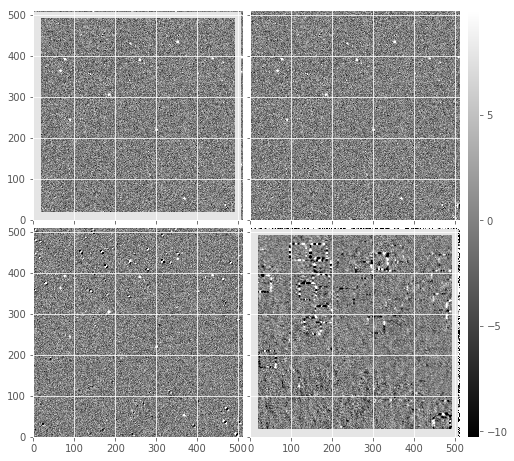

In [25]:
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

Try different `padSize`s -- zero is worse. Try 20. 20 is slightly better than the default of 7.

In [49]:
reload(dit)

newExp_Ispace = task.run(exposure2, template=template2, inImageSpace=True, 
                       Scorr=False, forceEvenSized=True, padSize=20).exposure

stats(mean=-0.076647274, stdev=24.546753, min=-128.09108, max=486.0)
stats(mean=0.052739725, stdev=24.627878, min=-449.20645, max=292.64359)
stats(mean=-0.16065285, stdev=2.0452485, min=-125.60004, max=457.20645)


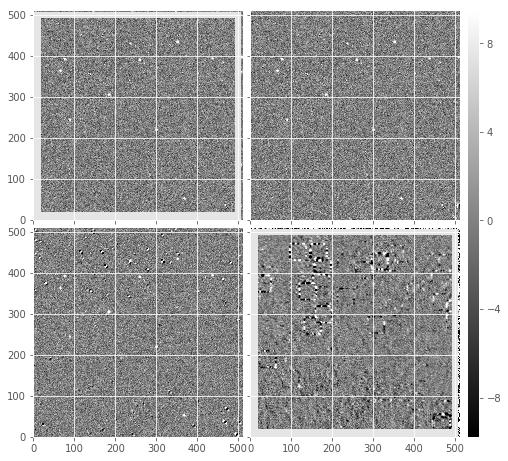

In [50]:
print dit.computeClippedImageStats(ga(newExp_Ispace))
print dit.computeClippedImageStats(ga(newExp_Fspace))
print dit.computeClippedImageStats(ga(newExp_Ispace)-ga(newExp_Fspace))
dit.plotImageGrid((ga(newExp_Ispace), ga(newExp_Fspace), testObj.D_Zogy.im, 
                   ga(newExp_Ispace)-ga(newExp_Fspace)), imScale=4)

Looks like we may need to make a smoother approximation to the PSF at each point.

Jim pointed me to `DoubleShapeletPsfApprox` -- look at `testForcedPlugin` in `meas_modelfit/tests/testDoubleShapeletPsfApprox.py`...

In [26]:
import os
import lsst.meas.modelfit as meas_modelfit
import lsst.afw.image as afwImage
import testDoubleShapeletPsfApprox as td
reload(td);

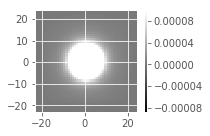

In [27]:
import lsst.utils.tests

class HigherOrderTestCase0(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self):
        np.random.seed(500)
        image = afwImage.ImageD(os.path.join("data", "psfs/great3-0.fits"))
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=3, outerOrder=2,
            atol=0.0005
        )

tc = HigherOrderTestCase0()
tc.setUp()
dit.plotImageGrid((tc.psf,))
msf = tc.testFitShapelets()

<class 'lsst.afw.image.image.image.ImageD'> <class 'lsst.afw.image.image.image.ImageD'>
stats(mean=5.2876473617836937e-06, stdev=4.4429553733233831e-06, min=-0.00013553022674543712, max=0.00031488658680425136)


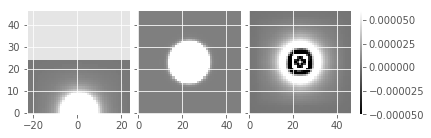

In [28]:
dataImage, modelImage = tc.makeImages(msf)
print type(dataImage), type(modelImage)
print dit.computeClippedImageStats(dataImage.getArray()-modelImage.getArray())
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

Now try it on my image's psfs!

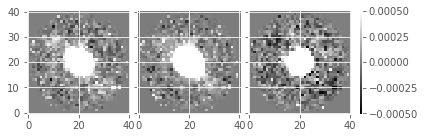

In [29]:
import lsst.afw.geom as afwGeom

def gp(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1])).getArray()
def gp2(exp, coord):
    return exp.getPsf().computeImage(afwGeom.Point2D(coord[0], coord[1]))
        
dit.plotImageGrid((gp(exposure2, [80,80]), gp(exposure2, [255,255]), gp(exposure2, [480,480])))
#                   clim=(-0.0005, 0.001), nrows_ncols=(3, 3))

tc.setImage(gp2(exposure2, [80,80]))

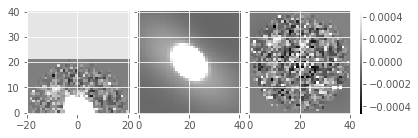

In [30]:
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
dit.plotImageGrid((dataImage, modelImage, dataImage.getArray()-modelImage.getArray()))

See if any other models get rid of those wings!

In [31]:
class SingleGaussianTestCase(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=lsst.afw.detection.GaussianPsf(25, 25, 2.0),
            innerOrder=0, outerOrder=0, peakRatio=0.0)
        self.setImage(image)

class HigherOrderTestCase0(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=3, outerOrder=2,
            atol=0.0005)
        self.setImage(image)

class HigherOrderTestCase1(td.DoubleShapeletPsfApproxTestMixin):
    def setUp(self, image):
        td.DoubleShapeletPsfApproxTestMixin.initialize(
            self, psf=image,
            innerOrder=2, outerOrder=1,
            atol=0.002)
        self.setImage(image)

8.09554243811e-05


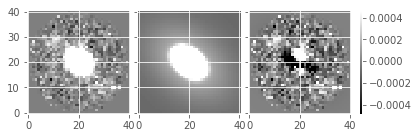

In [32]:
tc = SingleGaussianTestCase()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

3.98193450578e-05


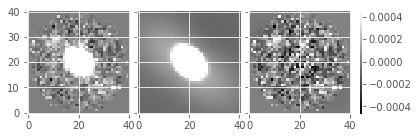

In [33]:
tc = HigherOrderTestCase0()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

4.05930173818e-05


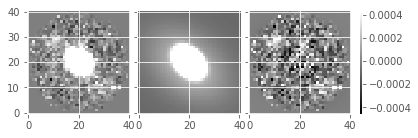

In [34]:
tc = HigherOrderTestCase1()
tc.setUp(gp2(exposure2, [80,80]))
msf = tc.testFitShapelets()
dataImage, modelImage = tc.makeImages(msf)
print np.sum((dataImage.getArray() - modelImage.getArray())**2)
dit.plotImageGrid((dataImage.getArray(), modelImage.getArray(), dataImage.getArray()-modelImage.getArray()))

In [35]:
def toTime(psf):
    tc = HigherOrderTestCase0()
    tc.setUp(psf)
    msf = tc.testFitShapelets()
    dataImage, modelImage = tc.makeImages(msf)

psf = gp2(exposure2, [80,80])
%timeit toTime(psf)

100 loops, best of 3: 2.05 ms per loop


In [36]:
def toTime(psf):
    tc = HigherOrderTestCase1()
    tc.setUp(psf)
    msf = tc.testFitShapelets()
    dataImage, modelImage = tc.makeImages(msf)

psf = gp2(exposure2, [80,80])
%timeit toTime(psf)

1000 loops, best of 3: 1.85 ms per loop


0.333333333333


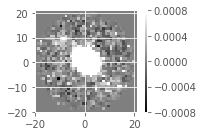

In [165]:
dit.plotImageGrid((exposure2.getPsf().computeImage(afwGeom.Point2D(0,0)),))

# psf goes from [1.8, 2.2-0.5] to [1.8, 2.2+0.5] = [1.8, 2.7]
print 1-1.8/2.7

In [173]:
import math

shape = exposure2.getPsf().computeShape(afwGeom.Point2D(0,0))
print shape
Ixx, Iyy, Ixy = shape.getIxx(), shape.getIyy(), shape.getIxy()
ePlus = (Ixx - Iyy) / (Ixx + Iyy)
eMinus =    2 * Ixy / (Ixx + Ixy)
print ePlus, eMinus
ellipticity = np.sqrt(ePlus**2 + eMinus**2)
angle = math.degrees(math.atan(eMinus/ePlus)/2.)
print ellipticity, angle
print shape.getParameterVector()
print shape.getDeterminantRadius()
print shape.getDeterminantRadius()*(1+(ellipticity-1)/2)
print shape.getDeterminantRadius()*(1-(ellipticity-1)/2)

(ixx=5.42155248714, iyy=5.39559844869, ixy=-2.21111471535)
0.00239934143464 -1.3774537135
1.37745580316 -44.9500992311
[ 5.42155249  5.39559845 -2.21111472]
2.22169728064
2.64099354637
1.80240101492


In [175]:
modelKernel = lsst.afw.math.FixedKernel(modelImage)
modelPsf = lsst.meas.algorithms.KernelPsf(modelKernel)

shape = modelPsf.computeShape()
shape = exposure2.getPsf().computeShape(afwGeom.Point2D(0,0))
print shape
Ixx, Iyy, Ixy = shape.getIxx(), shape.getIyy(), shape.getIxy()
ePlus = (Ixx - Iyy) / (Ixx + Iyy)
eMinus =    2 * Ixy / (Ixx + Iyy)
print ePlus, eMinus
ellipticity = np.sqrt(ePlus**2 + eMinus**2)
theta = math.atan(eMinus/ePlus)/2.
print ellipticity, math.degrees(theta)

# So b/a = 1-ellipticity
print 1-ellipticity, 1.8/2.7, shape.getDeterminantRadius(), (1.8+2.7)/2
print shape.getDeterminantRadius()*(1-ellipticity/2)
print shape.getDeterminantRadius()/(1-ellipticity/2)

(ixx=5.42155248714, iyy=5.39559844869, ixy=-2.21111471535)
0.00239934143464 -0.408816467195
0.408823507995 -44.8318676344
0.591176492005 0.666666666667 2.22169728064 2.25
1.76755624266
2.79252149816


see https://www.kaggle.com/c/mdm/details/ellipticity

In [176]:
e1 = (Ixx - Iyy) / (Ixx + Iyy + 2.*np.sqrt(Ixx*Iyy - Ixy**2))
e2 =     2 * Ixy / (Ixx + Iyy + 2.*np.sqrt(Ixx*Iyy - Ixy**2))
print e1, e2
ellipticity = np.sqrt(e1**2 + e2**2)
theta = math.atan(e2/e1)/2.
print ellipticity, math.degrees(theta)

# So b/a = 1-2*ellipticity
print 1-2*ellipticity, 1.8/2.7

# FWHMs of two axes are:
print 

0.00125448318577 -0.213747562875
0.21375124412 -44.8318676344
0.572497511759 0.666666666667



In [156]:
I = exposure2.getPsf().computeImage(afwGeom.Point2D(80,80)).getArray()
#I = modelImage.getArray()
x, y = np.meshgrid(np.arange(0, I.shape[0]), 
                   np.arange(0, I.shape[1]))
Isum = np.sum(I)
xBar = np.sum(x * I) / Isum
yBar = np.sum(y * I) / Isum
print xBar, yBar

Q11 = np.sum(I * (xBar - x) * (xBar - x)) / wsum
Q12 = np.sum(I * (xBar - x) * (yBar - y)) / wsum
Q22 = np.sum(I * (yBar - y) * (yBar - y)) / wsum
print Q11, Q12, Q22

e1 = (Q11 - Q22) / (Q11 + Q22 + 2*np.sqrt(Q11*Q22 - Q12**2))
e2 =     2 * Q12 / (Q11 + Q22 + 2*np.sqrt(Q11*Q22 - Q12**2))
print e1, e2
ellipticity = np.sqrt(e1**2 + e2**2)
theta = math.atan(e2/e1)/2.
print ellipticity, math.degrees(theta)

19.9849851703 19.9256191517
10.7793100001 -3.55857884894 9.14975706416
0.0423563216325 -0.184993450606
0.18978049096 -38.5518885176


In [159]:
ePlus = (Q11 - Q22) / (Q11 + Q22)
eMinus =    2 * Q12 / (Q11 + Q22)
print ePlus, eMinus
ellipticity = np.sqrt(ePlus**2 + eMinus**2)
theta = math.atan(eMinus/ePlus)/2.
print ellipticity, math.degrees(theta)

# So b/a = 1-ellipticity
print 1-ellipticity, 1.8/2.7

0.0817676477612 -0.357124479281
0.366365721544 -38.5518885176
0.633634278456 0.666666666667


In [219]:
def getPsfParameters(psf, coord):
    """ Return PSF parameters that can go into GaussianFunction2"""
    shape = psf.computeShape(afwGeom.Point2D(coord[0], coord[1]))
    print shape
    Ixx, Iyy, Ixy = shape.getIxx(), shape.getIyy(), shape.getIxy()
    ePlus = (Ixx - Iyy) / (Ixx + Iyy)
    eMinus =    2 * Ixy / (Ixx + Ixy)
    #print ePlus, eMinus
    ellipticity = np.sqrt(ePlus**2 + eMinus**2)
    print ellipticity
    angle = math.atan(eMinus/ePlus)/2.
    #print ellipticity, angle
    #print shape.getParameterVector()
    #print shape.getDeterminantRadius()
    #print shape.getDeterminantRadius()*(1+(ellipticity-1)/2)
    #print shape.getDeterminantRadius()*(1-(ellipticity-1)/2)
    return shape.getDeterminantRadius()*(1+(ellipticity-1)/2), \
        shape.getDeterminantRadius()*(1-(ellipticity-1)/2), angle
    
params = getPsfParameters(exposure2.getPsf(), [0,0])
print params, math.degrees(params[2])

(ixx=5.42155248714, iyy=5.39559844869, ixy=-2.21111471535)
1.37745580316
(2.6409935463675094, 1.8024010149197485, -0.7845272306813347) -44.9500992311


In [215]:
import lsst.afw.math as afwMath
f2 = afwMath.GaussianFunction2D(params[0], params[1], params[2])
f2(0, 0)

0.033435003148163896

In [216]:
x, y = np.meshgrid(np.arange(-20, 20, dtype=float), 
                   np.arange(-20, 20, dtype=float))
shape = x.shape
x = x.flatten()
y = y.flatten()
vals = np.array([f2(x[i], y[i]) for i in range(len(x))])

(1600,) (1600,) (40, 40)


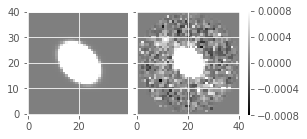

In [217]:
print vals.shape, x.shape, shape
vals = np.reshape(vals, shape)
dit.plotImageGrid((vals, exposure2.getPsf().computeImage(afwGeom.Point2D(0,0)).getArray()))

(ixx=5.42155248714, iyy=5.39559844869, ixy=-2.21111471535)
1.37745580316
(2.6409935463675094, 1.8024010149197485, -0.7845272306813347)
(ixx=4.00211249592, iyy=3.98755800556, ixy=-0.717450432013)
0.436852653873
(1.4242021230588962, 2.5405805405492159, -0.7833131712754624)
(ixx=3.24461917423, iyy=3.24653755032, ixy=0.0944556544782)
0.056576715427
(0.95153568867465388, 2.6507988121008421, -0.7827863273827641)


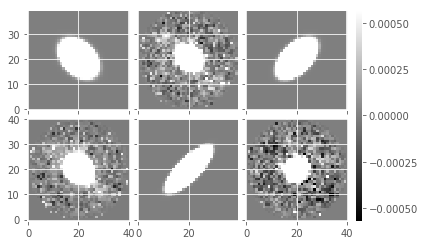

In [220]:
def makeGaussianPsf(psf, coords):
    params = getPsfParameters(psf, coords)
    print params
    f2 = afwMath.GaussianFunction2D(params[0], params[1], params[2])
    x, y = np.meshgrid(np.arange(-20, 20, dtype=float), 
                       np.arange(-20, 20, dtype=float))
    shape = x.shape
    x = x.flatten()
    y = y.flatten()
    vals = np.array([f2(x[i], y[i]) for i in range(len(x))])
    vals = np.reshape(vals, shape)
    return vals

dit.plotImageGrid((makeGaussianPsf(exposure2.getPsf(), [0,0]),
                  exposure2.getPsf().computeImage(afwGeom.Point2D(0,0)).getArray(),
                  makeGaussianPsf(exposure2.getPsf(), [255,255]),
                  exposure2.getPsf().computeImage(afwGeom.Point2D(255,255)).getArray(),
                  makeGaussianPsf(exposure2.getPsf(), [512,512]),
                  exposure2.getPsf().computeImage(afwGeom.Point2D(512,512)).getArray()))

In [234]:
[1.8, 2.2-0.5] to [1.8, 2.2+0.5] = [1.8, 2.7]
# [1.8, 1.7]
# e = 0.056576715427; shape = exposure2.getPsf().computeShape(afwGeom.Point2D(512,512))
# [1.8, 2.2]
#e = 0.436852653873; shape = exposure2.getPsf().computeShape(afwGeom.Point2D(255,255))
# [1.8, 2.7]
#e = 1.37745580316; shape = exposure2.getPsf().computeShape(afwGeom.Point2D(0,0))

rad = shape.getDeterminantRadius()
print rad, 1+(e-1)/2, 1-(e-1)/2
print rad*(1+e), rad/(1+e)
print rad*(1+(e-1)/2), rad*(1-(e-1)/2)
print 1/np.sqrt((e+1)**2-1)  # a/b

1.80116725039 0.528288357714 1.47171164229
1.90307137735 1.7047198032
0.951535688675 2.6507988121
2.93162676068


In [241]:
print 1.7/1.8  # e = 0.056576715427
print 1.8/2.2  # e = 0.436852653873
print 1.8/2.7  # e = 1.37745580316

0.944444444444
0.818181818182
0.666666666667
